<a href="https://colab.research.google.com/github/SudeshRPatil20/-Plant-Disease-Classification-Using-CNN-/blob/main/Decetron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist=distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 9.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15900, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 15900 (delta 69), reused 29 (delta 29), pack-reused 15787 (from 2)
Receiving objects: 100% (15900/15900), 6.45 MiB | 24.12 MiB/s, done.
Resolving deltas: 100% (11568/11568), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your 

In [3]:
# for verification
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [4]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERTION=torch.__version__.split("+")[-1]
print(CUDA_VERTION)
print(TORCH_VERSION)

cu124
2.6


In [5]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
%cd /content/drive/MyDrive/Dectron

/content/drive/MyDrive/Dectron


In [8]:
!unzip /content/drive/MyDrive/Dectron/aircraft.v1i.coco.zip


Streaming output truncated to the last 5000 lines.
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.3b1529852e8c761ace5209882ce78053.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.453784c8b2cfad5d3c084b90c7071c8a.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.4ac864ddb871b08e374a6304bd4ca1a0.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.6b5bd6d8deff80d032fc2ed264039b97.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.92a9ca76234c07889439999ca7e9f42c.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.a8aa411e0c1378e48dbcd1c20dcc79f7.jpg  
 extracting: train/d59e7d91fab2b2230031c954f72ee0c0_jpg.rf.f81d5e2c1deb9a5463282af1ed8c30f0.jpg  
 extracting: train/d5a82e9cf79480ad025174917840649f_jpg.rf.47cc6ea5bcd3907fe78485f31a32ca50.jpg  
 extracting: train/d5a82e9cf79480ad025174917840649f_jpg.rf.4c479b60667c87f306516d6275b89d05.jpg  
 extracting: train/d5a82e9cf79480ad025174917840649f_jpg.rf.e9a268fb

In [10]:

from detectron2.data.datasets import register_coco_instances
register_coco_instances("exp_train", {}, "/content/drive/MyDrive/Dectron/train/_annotations.coco.json", "/content/drive/MyDrive/Dectron/train")
register_coco_instances("exp_val", {}, "/content/drive/MyDrive/Dectron/valid/_annotations.coco.json", "/content/drive/MyDrive/Dectron/valid")
register_coco_instances("exp_test", {}, "/content/drive/MyDrive/Dectron/test/_annotations.coco.json", "/content/drive/MyDrive/Dectron/test")

In [9]:
!cat /content/drive/MyDrive/Dectron/train/_annotations.coco.json

{"info":{"year":"2024","version":"1","description":"Exported from roboflow.com","contributor":"","url":"https://public.roboflow.com/object-detection/undefined","date_created":"2024-05-15T15:20:03+00:00"},"licenses":[{"id":1,"url":"https://choosealicense.com/licenses/mit/","name":"MIT"}],"categories":[{"id":0,"name":"aircraft","supercategory":"none"},{"id":1,"name":"A10","supercategory":"aircraft"},{"id":2,"name":"A400M","supercategory":"aircraft"},{"id":3,"name":"AG600","supercategory":"aircraft"},{"id":4,"name":"B1","supercategory":"aircraft"},{"id":5,"name":"B2","supercategory":"aircraft"},{"id":6,"name":"B52","supercategory":"aircraft"},{"id":7,"name":"Be200","supercategory":"aircraft"},{"id":8,"name":"C130","supercategory":"aircraft"},{"id":9,"name":"C17","supercategory":"aircraft"},{"id":10,"name":"C5","supercategory":"aircraft"},{"id":11,"name":"E2","supercategory":"aircraft"},{"id":12,"name":"EF2000","supercategory":"aircraft"},{"id":13,"name":"F117","supercategory":"aircraft"},

WARNING [08/10 13:22:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/10 13:22:28 d2.data.datasets.coco]: Loaded 25217 images in COCO format from /content/drive/MyDrive/Dectron/train/_annotations.coco.json


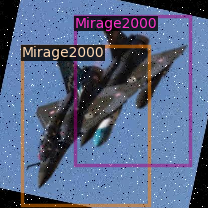

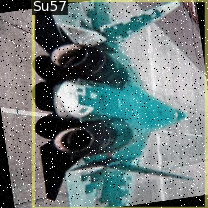

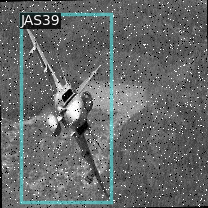

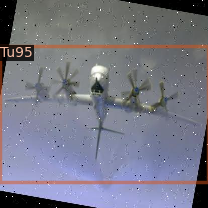

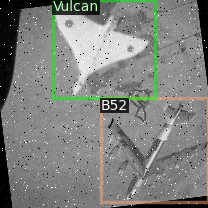

In [12]:
# visulize training data
my_dataset_train_metadata=MetadataCatalog.get("exp_train")
dataset_dicts=DatasetCatalog.get("exp_train")


import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
  img=cv2.imread(d["file_name"])
  visulizer=Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
  vis=visulizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:, :, ::-1])

In [13]:
from detectron2.engine import DefaultTrainer

cfg=get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("exp_train")
cfg.DATALOADER.NUM_WORKERS=2
cfg.MODEL.WEIGHTS=model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH=2
cfg.SOLVER.BASE_LR=0.0025
cfg.SOLVER.MAX_ITER=40
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 40
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer=DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[08/10 13:39:53 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 213MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/10 13:39:56 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/10 13:40:06 d2.utils.events]:  eta: 0:00:05  iter: 19  total_loss: 2.524  loss_cls: 1.794  loss_box_reg: 0.4249  loss_rpn_cls: 0.04287  loss_rpn_loc: 0.01985    time: 0.2755  last_time: 0.2824  data_time: 0.0178  last_data_time: 0.0041   lr: 0.0011888  max_mem: 1739M
[08/10 13:40:18 d2.utils.events]:  eta: 0:00:00  iter: 39  total_loss: 1.294  loss_cls: 0.69  loss_box_reg: 0.5101  loss_rpn_cls: 0.03523  loss_rpn_loc: 0.009243    time: 0.2767  last_time: 0.2311  data_time: 0.0047  last_data_time: 0.0047   lr: 0.0024376  max_mem: 1740M
[08/10 13:40:18 d2.engine.hooks]: Overall training speed: 38 iterations in 0:00:10 (0.2767 s / it)
[08/10 13:40:18 d2.engine.hooks]: Total training time: 0:00:17 (0:00:06 on hooks)


FileNotFoundError: [Errno 2] No such file or directory: 'datasets/coco/annotations/instances_val2017.json'

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("exp_train", )
predictor = DefaultPredictor(cfg)


[08/10 13:48:42 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


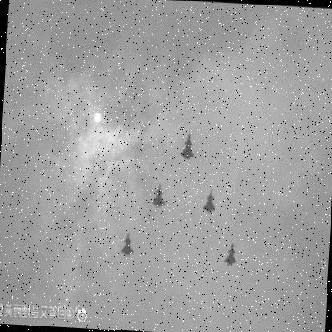

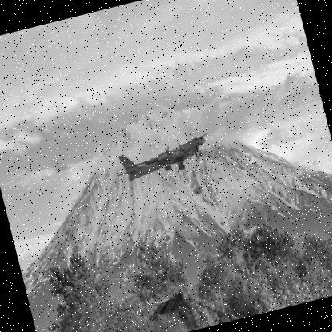

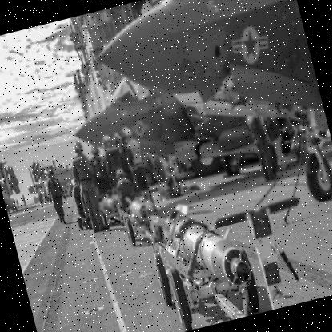

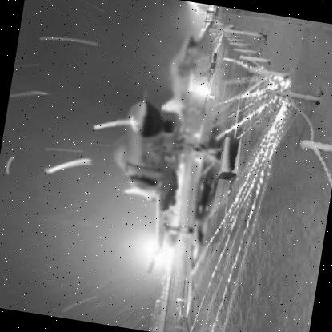

In [28]:
import random
import cv2
from detectron2.utils.visualizer import Visualizer, ColorMode
from google.colab.patches import cv2_imshow  # ✅ Use this in Colab

for d in random.sample(dataset_dicts, 4):
    # Read the image
    im = cv2.imread(d["file_name"])

    # Run inference
    outputs = predictor(im)

    # Visualize predictions
    v = Visualizer(
        im[:, :, ::-1],  # BGR to RGB
        metadata=my_dataset_train_metadata,
        scale=0.8,
        instance_mode=ColorMode.IMAGE_BW
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Convert image to BGR before displaying
    output_img = v.get_image()[:, :, ::-1]

    # ✅ Show the image in Colab
    cv2_imshow(output_img)


In [26]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader  # ✅ correct import

# Create the evaluator
evaluator = COCOEvaluator("exp_test", cfg, False, output_dir="./output")

# Build the test data loader
val_loader = build_detection_test_loader(cfg, "exp_test")

# Run evaluation
print(inference_on_dataset(predictor.model, val_loader, evaluator))


[08/10 14:05:20 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [08/10 14:05:20 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [08/10 14:05:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/10 14:05:20 d2.data.datasets.coco]: Loaded 438 images in COCO format from /content/drive/MyDrive/Dectron/test/_annotations.coco.json
[08/10 14:05:20 d2.data.build]: Distribution of instances among all 41 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  aircraft  | 0            |    A10     | 26           |   A400M    | 21           |
|   AG600    | 7            |     B1     | 14           |     B2     | 12           |
|    B52     | 

In [27]:
f=open("config.yml", 'w')
f.write(cfg.dump())
f.close()
